# K-Means Clustering of IMU and Odometry Data from TurtleBot3
### By Jacob Laframboise
Here we take in a dataset of imu data recorded from the TurtleBot3 Waffle Pi driving on 2 different surfaces at 4 different speeds each, and use K-means clustering to assign each data point to a cluster. Then we use PCA to visualize this high (118) dimension data in 2 or 3 dimensions. Matplotlib is used to plot in 2D, and Plotly is used to plot in 3D interactively, so we can better see the clusters. 

This notebook picks up from where the Python file PreprocessForKmeans.py leaves off, taking in the cleaned dataset. 

In [8]:
# imports
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
import os
from sklearn.cluster import KMeans
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler, MinMaxScaler, RobustScaler, PowerTransformer

import plotly as ply
import plotly.graph_objs as go
from plotly.offline import download_plotlyjs, init_notebook_mode, plot, iplot
%matplotlib notebook

pd.set_option('display.max_columns', 120)
pd.set_option('display.max_rows', 80)

In [9]:
# load data
dataFolder = r"C:\Users\jaker\Documents\RoboData-Experiment1"
data = "AllDataDfDelta30.csv"

df = pd.read_csv(os.path.join(dataFolder, data))

In [10]:
# fix index from read_csv
df = df.rename(columns={'Unnamed: 0': 'Seq'})
df = df.set_index('Seq')

In [11]:
df.head(10)

,OdomPosX,OdomPosY,OdomOrientZ,OdomOrientW,OdomLinX,OdomAngZ,ImuOrientX,ImuOrientY,ImuOrientZ,ImuOrientW,ImuAngVelX,ImuAngVelY,ImuAngVelZ,ImuAccelX,ImuAccelY,ImuAccelZ,TimeDelta1,TimeDelta11,TimeDelta21,TimeDelta31,TimeDelta41,TimeDelta51,TimeDelta61,TimeDelta71,TimeDelta81,TimeDelta91,TimeDelta101,TimeDelta111,TimeDelta121,TimeDelta131,TimeDelta141,TimeDelta151,TimeDelta161,TimeDelta171,TimeDelta181,TimeDelta191,TimeDelta201,TimeDelta211,TimeDelta221,TimeDelta231,TimeDelta241,TimeDelta251,TimeDelta261,TimeDelta271,TimeDelta281,TimeDelta291,TimeDelta301,OdomPosXDelta1,OdomPosXDelta11,OdomPosXDelta21,OdomPosXDelta31,OdomPosXDelta41,OdomPosXDelta51,OdomPosXDelta61,OdomPosXDelta71,OdomPosXDelta81,OdomPosXDelta91,OdomPosXDelta101,OdomPosXDelta111,OdomPosXDelta121,...,ImuAccelYDelta51,ImuAccelYDelta61,ImuAccelYDelta71,ImuAccelYDelta81,ImuAccelYDelta91,ImuAccelYDelta101,ImuAccelYDelta111,ImuAccelYDelta121,ImuAccelYDelta131,ImuAccelYDelta141,ImuAccelYDelta151,ImuAccelYDelta161,ImuAccelYDelta171,ImuAccelYDelta181,ImuAccelYDelta191,ImuAccelYDelta201,ImuAccelYDelta211,ImuAccelYDelta221,ImuAccelYDelta231,ImuAccelYDelta241,ImuAccelYDelta251,ImuAccelYDelta261,ImuAccelYDelta271,ImuAccelYDelta281,ImuAccelYDelta291,ImuAccelYDelta301,ImuAccelZDelta1,ImuAccelZDelta11,ImuAccelZDelta21,ImuAccelZDelta31,ImuAccelZDelta41,ImuAccelZDelta51,ImuAccelZDelta61,ImuAccelZDelta71,ImuAccelZDelta81,ImuAccelZDelta91,ImuAccelZDelta101,ImuAccelZDelta111,ImuAccelZDelta121,ImuAccelZDelta131,ImuAccelZDelta141,ImuAccelZDelta151,ImuAccelZDelta161,ImuAccelZDelta171,ImuAccelZDelta181,ImuAccelZDelta191,ImuAccelZDelta201,ImuAccelZDelta211,ImuAccelZDelta221,ImuAccelZDelta231,ImuAccelZDelta241,ImuAccelZDelta251,ImuAccelZDelta261,ImuAccelZDelta271,ImuAccelZDelta281,ImuAccelZDelta291,ImuAccelZDelta301,Speed,Terrain,Trial
Seq,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
0,101.236073,7.727499,0.271481,0.962444,0.148332,0.002560,0.004440,-0.014551,-0.545528,0.837949,0.021284,0.008514,0.013835,0.246004,0.289698,10.174759,0.000030,0.056861,0.121929,0.176428,0.237168,0.291568,0.354699,0.415367,0.476153,0.535056,0.593207,0.642440,0.716158,0.776474,0.837746,0.896430,0.959720,1.015709,1.077910,1.131701,1.193373,1.256298,1.311569,1.372689,1.434524,1.499707,1.553930,1.602244,1.660111,1.739998,1.799607,0.000774,0.006644,0.014467,0.022620,0.030581,0.036799,0.045454,0.052439,0.060308,0.069749,0.075934,0.084594,0.091356,...,0.189740,0.132878,0.214880,0.095170,0.186748,-0.023942,0.073023,0.191536,0.140061,-0.077812,0.034117,-0.146046,0.204106,0.062249,-0.116717,0.205901,-0.141856,0.204106,-0.018555,0.074819,-0.102951,0.217872,0.241216,-0.028132,0.019154,-0.025139,-0.176572,0.086790,-0.106542,0.327408,0.232238,-0.377685,0.345364,0.051476,-0.427364,0.128090,0.329204,-0.207098,-0.136469,0.096966,-0.302866,-0.237025,0.034118,-0.664989,-0.645836,-0.328604,0.043096,0.531513,0.681150,-0.549469,-1.055842,-0.819415,0.315436,-0.314239,-0.094570,-0.463278,0.115222,15,Turf,2
1,101.236847,7.727973,0.271494,0.962440,0.147744,0.004663,0.004627,-0.015302,-0.545561,0.837913,0.013835,0.008514,0.000532,0.275034,0.313341,9.970354,0.008693,0.060903,0.118744,0.180629,0.241271,0.295944,0.358029,0.414178,0.474103,0.539442,0.596471,0.651092,0.717194,0.779053,0.831974,0.897493,0.959977,1.019013,1.075933,1.135894,1.197795,1.255287,1.315660,1.371302,1.433078,1.496586,1.558186,1.610911,1.668778,1.744285,1.800593,0.000774,0.007018,0.014114,0.022786,0.030722,0.036961,0.045614,0.051735,0.060486,0.069903,0.076091,0.084644,0.091133,...,0.213383,0.156521,0.183755,0.132579,0.067935,-0.000299,0.096666,0.232836,0.163704,0.090980,0.120309,-0.069731,0.330101,0.007183,-0.096666,0.229544,0.024541,0.227748,-0.000599,0.122703,-0.109235,0.241515,0.127791,-0.004489,0.016460,-0.005088,-0.204405,-0.117615,-0.381576,0.090681,0.029628,-0.582090,0.140958,-0.522834,-0.463876,0.008081,0.124798,-0.411503,-0.176871,-0.107440,-0.336685,-0.315136,-0.225354,-0.623989,-0.80

In [12]:
# check for none values and correct size
print(df.isnull().sum().sum()) # check for NaN
df.shape

0


(244905, 546)

### Feature engineering: elimination

In [13]:
# eliminate columns derived from time, and from angular velocity
columnsToDrop = [x for x in df.columns.tolist() if 'Time' in x or ('Delta' not in x and 'Speed' not in x and 'Terrain' not in x) ]
df = df.drop(columns=columnsToDrop)

### Speed filtering

In [14]:
df = df[df['Speed']==15]

### Kmeans
#### Now that we have processed the data, we can apply Kmeans to cluster it.

In [15]:
# separate labels
terrains = df['Terrain']
speeds = df['Speed']
df= df.drop(columns=['Terrain', 'Speed'])

In [16]:
# scale the values for K means
scaler = MinMaxScaler()

scaledFeatures = scaler.fit_transform(df.values)

df = pd.DataFrame(scaledFeatures, columns = df.columns.tolist())

#df = pd.DataFrame(scaler.fit_transform(df))

In [17]:
df.head(8)

,OdomPosXDelta1,OdomPosXDelta11,OdomPosXDelta21,OdomPosXDelta31,OdomPosXDelta41,OdomPosXDelta51,OdomPosXDelta61,OdomPosXDelta71,OdomPosXDelta81,OdomPosXDelta91,OdomPosXDelta101,OdomPosXDelta111,OdomPosXDelta121,OdomPosXDelta131,OdomPosXDelta141,OdomPosXDelta151,OdomPosXDelta161,OdomPosXDelta171,OdomPosXDelta181,OdomPosXDelta191,OdomPosXDelta201,OdomPosXDelta211,OdomPosXDelta221,OdomPosXDelta231,OdomPosXDelta241,OdomPosXDelta251,OdomPosXDelta261,OdomPosXDelta271,OdomPosXDelta281,OdomPosXDelta291,OdomPosXDelta301,OdomPosYDelta1,OdomPosYDelta11,OdomPosYDelta21,OdomPosYDelta31,OdomPosYDelta41,OdomPosYDelta51,OdomPosYDelta61,OdomPosYDelta71,OdomPosYDelta81,OdomPosYDelta91,OdomPosYDelta101,OdomPosYDelta111,OdomPosYDelta121,OdomPosYDelta131,OdomPosYDelta141,OdomPosYDelta151,OdomPosYDelta161,OdomPosYDelta171,OdomPosYDelta181,OdomPosYDelta191,OdomPosYDelta201,OdomPosYDelta211,OdomPosYDelta221,OdomPosYDelta231,OdomPosYDelta241,OdomPosYDelta251,OdomPosYDelta261,OdomPosYDelta271,OdomPosYDelta281,...,ImuAccelYDelta21,ImuAccelYDelta31,ImuAccelYDelta41,ImuAccelYDelta51,ImuAccelYDelta61,ImuAccelYDelta71,ImuAccelYDelta81,ImuAccelYDelta91,ImuAccelYDelta101,ImuAccelYDelta111,ImuAccelYDelta121,ImuAccelYDelta131,ImuAccelYDelta141,ImuAccelYDelta151,ImuAccelYDelta161,ImuAccelYDelta171,ImuAccelYDelta181,ImuAccelYDelta191,ImuAccelYDelta201,ImuAccelYDelta211,ImuAccelYDelta221,ImuAccelYDelta231,ImuAccelYDelta241,ImuAccelYDelta251,ImuAccelYDelta261,ImuAccelYDelta271,ImuAccelYDelta281,ImuAccelYDelta291,ImuAccelYDelta301,ImuAccelZDelta1,ImuAccelZDelta11,ImuAccelZDelta21,ImuAccelZDelta31,ImuAccelZDelta41,ImuAccelZDelta51,ImuAccelZDelta61,ImuAccelZDelta71,ImuAccelZDelta81,ImuAccelZDelta91,ImuAccelZDelta101,ImuAccelZDelta111,ImuAccelZDelta121,ImuAccelZDelta131,ImuAccelZDelta141,ImuAccelZDelta151,ImuAccelZDelta161,ImuAccelZDelta171,ImuAccelZDelta181,ImuAccelZDelta191,ImuAccelZDelta201,ImuAccelZDelta211,ImuAccelZDelta221,ImuAccelZDelta231,ImuAccelZDelta241,ImuAccelZDelta251,ImuAccelZDelta261,ImuAccelZDelta271,ImuAccelZDelta281,ImuAccelZDelta291,ImuAccelZDelta301
0,0.419975,0.492117,0.537899,0.595233,0.640213,0.671743,0.695755,0.713634,0.742145,0.751155,0.749329,0.773571,0.781960,0.784377,0.793447,0.792836,0.800093,0.805080,0.806216,0.807469,0.819951,0.825770,0.821731,0.818877,0.827799,0.828563,0.829748,0.836957,0.838104,0.836349,0.840216,0.573042,0.738201,0.823705,0.858733,0.861446,0.870428,0.883309,0.878754,0.872226,0.873192,0.862392,0.862983,0.856194,0.848221,0.847583,0.844634,0.840630,0.839133,0.838223,0.832059,0.831728,0.827533,0.829335,0.825307,0.823129,0.820907,0.819671,0.816966,0.815138,...,0.538525,0.538693,0.477530,0.549346,0.550158,0.537790,0.540696,0.572872,0.515383,0.503736,0.528348,0.540870,0.454313,0.528821,0.472202,0.546452,0.519899,0.462038,0.578843,0.472246,0.567337,0.489528,0.551216,0.496703,0.510480,0.583347,0.496842,0.485931,0.480811,0.512485,0.560541,0.527292,0.540365,0.535699,0.423258,0.539949,0.499932,0.474712,0.507845,0.508422,0.496468,0.520087,0.512085,0.416552,0.473025,0.507782,0.475408,0.457953,0.492534,0.539944,0.526338,0.547021,0.492036,0.442501,0.466720,0.462985,0.471624,0.494983,0.437596,0.492200
1,0.419975,0.496579,0.534597,0.596572,0.641135,0.672743,0.696652,0.710015,0.743004,0.751836,0.749983,0.773760,0.781146,0.784893,0.790926,0.793352,0.800545,0.805543,0.806659,0.807910,0.820352,0.825405,0.822116,0.817174,0.828126,0.828852,0.829315,0.837383,0.838198,0.836264,0.840483,0.573042,0.740943,0.822130,0.859273,0.861808,0.870776,0.883594,0.877630,0.872505,0.873423,0.862614,0.863052,0.855908,0.848413,0.846652,0.844824,0.840801,0.839309,0.838395,0.832231,0.831888,0.827378,0.829486,0.824584,0.823257,0.821021,0.819473,0.817138,0.815166,...,0.497177,0.543032,0.502580,0.555427,0.557110,0.529533,0.550151,0.541045,0.521952,0.509411,0.539589,0.547859,0.502477,0.552536,0.495068,0.581436,0.505370,0.467218,0.585372,0.515290,0.573693,0.494114,0.565207,0.495054,0.516612,0.551212,0.503584,0.485204,0.486037,0.511292,0.550519,0.514256,0.528312,0.52579

In [18]:
# apply K means clustering
kmeans = KMeans(n_clusters=4)
kmeans.fit(df)

KMeans(algorithm='auto', copy_x=True, init='k-means++', max_iter=300,
       n_clusters=4, n_init=10, n_jobs=None, precompute_distances='auto',
       random_state=None, tol=0.0001, verbose=0)

In [19]:
labels = kmeans.predict(df)
centroids = kmeans.cluster_centers_

In [20]:
# re add labels
df['Cluster'] = labels
df['Speed'] = speeds.values
df['Terrain'] = terrains.values

In [21]:
df.head(10)

,OdomPosXDelta1,OdomPosXDelta11,OdomPosXDelta21,OdomPosXDelta31,OdomPosXDelta41,OdomPosXDelta51,OdomPosXDelta61,OdomPosXDelta71,OdomPosXDelta81,OdomPosXDelta91,OdomPosXDelta101,OdomPosXDelta111,OdomPosXDelta121,OdomPosXDelta131,OdomPosXDelta141,OdomPosXDelta151,OdomPosXDelta161,OdomPosXDelta171,OdomPosXDelta181,OdomPosXDelta191,OdomPosXDelta201,OdomPosXDelta211,OdomPosXDelta221,OdomPosXDelta231,OdomPosXDelta241,OdomPosXDelta251,OdomPosXDelta261,OdomPosXDelta271,OdomPosXDelta281,OdomPosXDelta291,OdomPosXDelta301,OdomPosYDelta1,OdomPosYDelta11,OdomPosYDelta21,OdomPosYDelta31,OdomPosYDelta41,OdomPosYDelta51,OdomPosYDelta61,OdomPosYDelta71,OdomPosYDelta81,OdomPosYDelta91,OdomPosYDelta101,OdomPosYDelta111,OdomPosYDelta121,OdomPosYDelta131,OdomPosYDelta141,OdomPosYDelta151,OdomPosYDelta161,OdomPosYDelta171,OdomPosYDelta181,OdomPosYDelta191,OdomPosYDelta201,OdomPosYDelta211,OdomPosYDelta221,OdomPosYDelta231,OdomPosYDelta241,OdomPosYDelta251,OdomPosYDelta261,OdomPosYDelta271,OdomPosYDelta281,...,ImuAccelYDelta51,ImuAccelYDelta61,ImuAccelYDelta71,ImuAccelYDelta81,ImuAccelYDelta91,ImuAccelYDelta101,ImuAccelYDelta111,ImuAccelYDelta121,ImuAccelYDelta131,ImuAccelYDelta141,ImuAccelYDelta151,ImuAccelYDelta161,ImuAccelYDelta171,ImuAccelYDelta181,ImuAccelYDelta191,ImuAccelYDelta201,ImuAccelYDelta211,ImuAccelYDelta221,ImuAccelYDelta231,ImuAccelYDelta241,ImuAccelYDelta251,ImuAccelYDelta261,ImuAccelYDelta271,ImuAccelYDelta281,ImuAccelYDelta291,ImuAccelYDelta301,ImuAccelZDelta1,ImuAccelZDelta11,ImuAccelZDelta21,ImuAccelZDelta31,ImuAccelZDelta41,ImuAccelZDelta51,ImuAccelZDelta61,ImuAccelZDelta71,ImuAccelZDelta81,ImuAccelZDelta91,ImuAccelZDelta101,ImuAccelZDelta111,ImuAccelZDelta121,ImuAccelZDelta131,ImuAccelZDelta141,ImuAccelZDelta151,ImuAccelZDelta161,ImuAccelZDelta171,ImuAccelZDelta181,ImuAccelZDelta191,ImuAccelZDelta201,ImuAccelZDelta211,ImuAccelZDelta221,ImuAccelZDelta231,ImuAccelZDelta241,ImuAccelZDelta251,ImuAccelZDelta261,ImuAccelZDelta271,ImuAccelZDelta281,ImuAccelZDelta291,ImuAccelZDelta301,Cluster,Speed,Terrain
0,0.419975,0.492117,0.537899,0.595233,0.640213,0.671743,0.695755,0.713634,0.742145,0.751155,0.749329,0.773571,0.781960,0.784377,0.793447,0.792836,0.800093,0.805080,0.806216,0.807469,0.819951,0.825770,0.821731,0.818877,0.827799,0.828563,0.829748,0.836957,0.838104,0.836349,0.840216,0.573042,0.738201,0.823705,0.858733,0.861446,0.870428,0.883309,0.878754,0.872226,0.873192,0.862392,0.862983,0.856194,0.848221,0.847583,0.844634,0.840630,0.839133,0.838223,0.832059,0.831728,0.827533,0.829335,0.825307,0.823129,0.820907,0.819671,0.816966,0.815138,...,0.549346,0.550158,0.537790,0.540696,0.572872,0.515383,0.503736,0.528348,0.540870,0.454313,0.528821,0.472202,0.546452,0.519899,0.462038,0.578843,0.472246,0.567337,0.489528,0.551216,0.496703,0.510480,0.583347,0.496842,0.485931,0.480811,0.512485,0.560541,0.527292,0.540365,0.535699,0.423258,0.539949,0.499932,0.474712,0.507845,0.508422,0.496468,0.520087,0.512085,0.416552,0.473025,0.507782,0.475408,0.457953,0.492534,0.539944,0.526338,0.547021,0.492036,0.442501,0.466720,0.462985,0.471624,0.494983,0.437596,0.492200,0,15,Turf
1,0.419975,0.496579,0.534597,0.596572,0.641135,0.672743,0.696652,0.710015,0.743004,0.751836,0.749983,0.773760,0.781146,0.784893,0.790926,0.793352,0.800545,0.805543,0.806659,0.807910,0.820352,0.825405,0.822116,0.817174,0.828126,0.828852,0.829315,0.837383,0.838198,0.836264,0.840483,0.573042,0.740943,0.822130,0.859273,0.861808,0.870776,0.883594,0.877630,0.872505,0.873423,0.862614,0.863052,0.855908,0.848413,0.846652,0.844824,0.840801,0.839309,0.838395,0.832231,0.831888,0.827378,0.829486,0.824584,0.823257,0.821021,0.819473,0.817138,0.815166,...,0.555427,0.557110,0.529533,0.550151,0.541045,0.521952,0.509411,0.539589,0.547859,0.502477,0.552536,0.495068,0.581436,0.505370,0.467218,0.585372,0.515290,0.573693,0.494114,0.565207,0.495054,0.516612,0.551212,0.503584,0.485204,0.486037,0.511292,0.550519,0.514256,0.528312,0.525798,0.412821,0.530611,0.467178,0.473080,0.502125,0.498522,0.486290,0.517960

In [22]:
# alias the PCA function
pca_1d = PCA(n_components=1)
pca_2d = PCA(n_components=2)
pca_3d = PCA(n_components=3)

In [23]:
# apply PCA on the data for visualization
pc1Df = pd.DataFrame(pca_1d.fit_transform(df.drop(columns=['Cluster', 'Speed', 'Terrain'])))
pc2Df = pd.DataFrame(pca_2d.fit_transform(df.drop(columns=['Cluster', 'Speed', 'Terrain'])))
pc3Df = pd.DataFrame(pca_3d.fit_transform(df.drop(columns=['Cluster', 'Speed', 'Terrain'])))

In [24]:
pc1Df.columns = ["PC1_1d"]
pc2Df.columns = ["PC1_2d", "PC2_2d"]
pc3Df.columns = ["PC1_3d", "PC2_3d", "PC3_3d"]

In [25]:
pc3Df.head()

,PC1_3d,PC2_3d,PC3_3d
0,-0.612923,-0.614276,-0.084844
1,-0.614087,-0.619032,-0.060796
2,-0.612255,-0.623335,-0.073156
3,-0.608277,-0.627310,-0.078192
4,-0.604217,-0.626587,-0.099509


In [26]:
pc3Df.tail()

,PC1_3d,PC2_3d,PC3_3d
38564,0.058827,-1.063766,0.364214
38565,0.059444,-1.057040,0.373856
38566,0.057627,-1.054744,0.369451
38567,0.058344,-1.051917,0.382244
38568,0.058685,-1.049135,0.387058


In [27]:
# add pca columns to data
df = pd.concat([df, pc1Df, pc2Df, pc3Df], axis=1, join='inner')
df['Zeros']=0

In [28]:
# separate clusters to dataframes
c0 = df[df['Cluster']==0]
c1 = df[df['Cluster']==1]
c2 = df[df['Cluster']==2]
c3 = df[df['Cluster']==3]
# c4 = df[df['Cluster']==4]
# c5 = df[df['Cluster']==5]
# c6 = df[df['Cluster']==6]
# c7 = df[df['Cluster']==7]

In [29]:
# separate data by actuall terrain
tile = df[df['Terrain']=='MitTile']
turf = df[df['Terrain']=='Turf']
arcTile = df[df['Terrain']=='ArcTile']
carp = df[df['Terrain']=='Carp']

In [30]:
# smaller dataframe without all ~100 features
results = df[['Cluster', 'Terrain', 'Speed']]

<IPython.core.display.Javascript object>


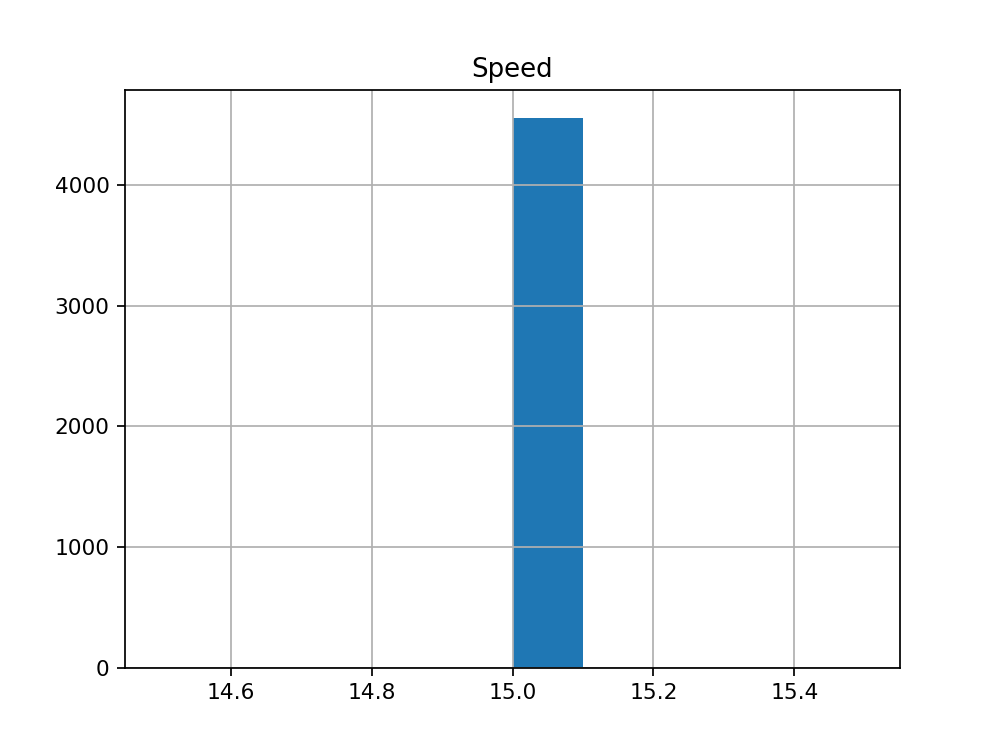

array([[<matplotlib.axes._subplots.AxesSubplot object at 0x00000286CDEE3388>]],
      dtype=object)

In [31]:
# look at distribution of speeds in a cluster
results[results.Cluster==1].drop(columns=['Cluster', 'Terrain']).hist()

In [32]:
# look at which clusters contain mostly one surface or another
for c in range(4):
    print(c)
    r = results[results.Cluster==c].drop(columns='Speed')
    print(r.groupby('Terrain').count())
    print('\n')

0
         Cluster
Terrain         
ArcTile     4577
Carp         733
MitTile     9820
Turf        8059


1
         Cluster
Terrain         
ArcTile     4559


2
         Cluster
Terrain         
Carp        4514


3
         Cluster
Terrain         
Carp        3788
Turf        2519




<IPython.core.display.Javascript object>


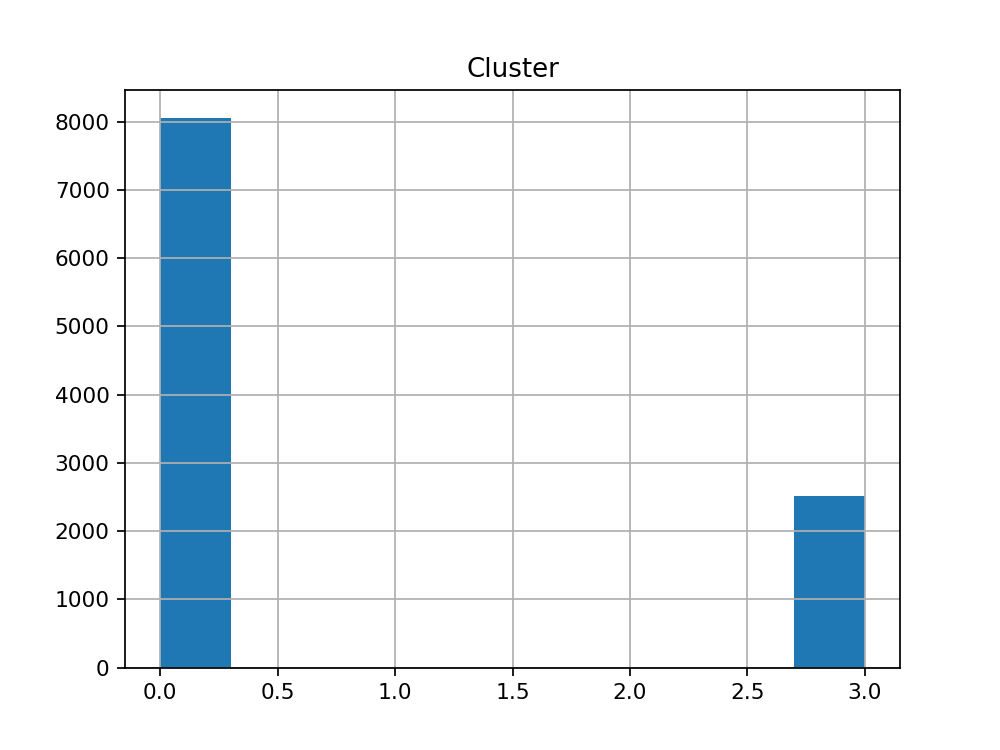

array([[<matplotlib.axes._subplots.AxesSubplot object at 0x00000286D3CF1F08>]],
      dtype=object)

In [33]:
# show which clusters have turf terrain
results[results['Terrain']=='Turf'].drop(columns='Speed').hist()

### Visualization: PCA components

<IPython.core.display.Javascript object>


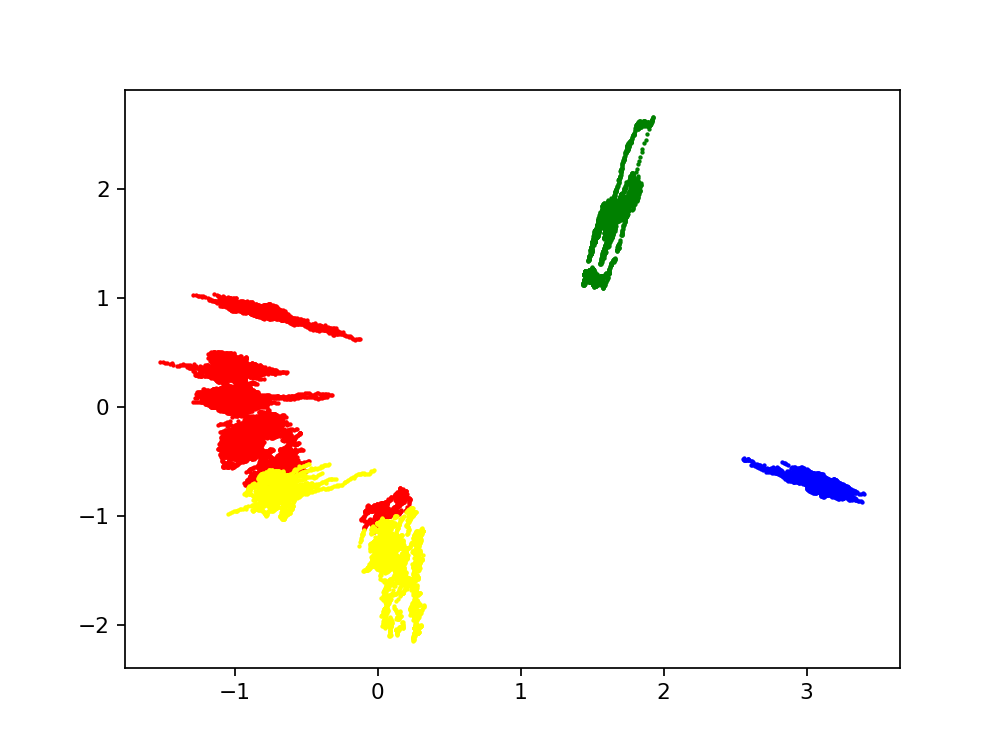

In [34]:
# matplotlib for 2D plotting of clusters
plt.figure()
plt.scatter(x=c0['PC1_2d'], y=c0['PC2_2d'], c='red', s=1)
plt.scatter(x=c1['PC1_2d'], y=c1['PC2_2d'], c='blue', s=1)
plt.scatter(x=c2['PC1_2d'], y=c2['PC2_2d'], c='green', s=1)
plt.scatter(x=c3['PC1_2d'], y=c3['PC2_2d'], c='yellow', s=1)
# plt.scatter(x=c4['PC1_2d'], y=c4['PC2_2d'], c='orange', s=1)
# plt.scatter(x=c5['PC1_2d'], y=c5['PC2_2d'], c='brown', s=1)
# plt.scatter(x=c6['PC1_2d'], y=c6['PC2_2d'], c='grey', s=1)
# plt.scatter(x=c7['PC1_2d'], y=c7['PC2_2d'], c='purple', s=1)

<IPython.core.display.Javascript object>


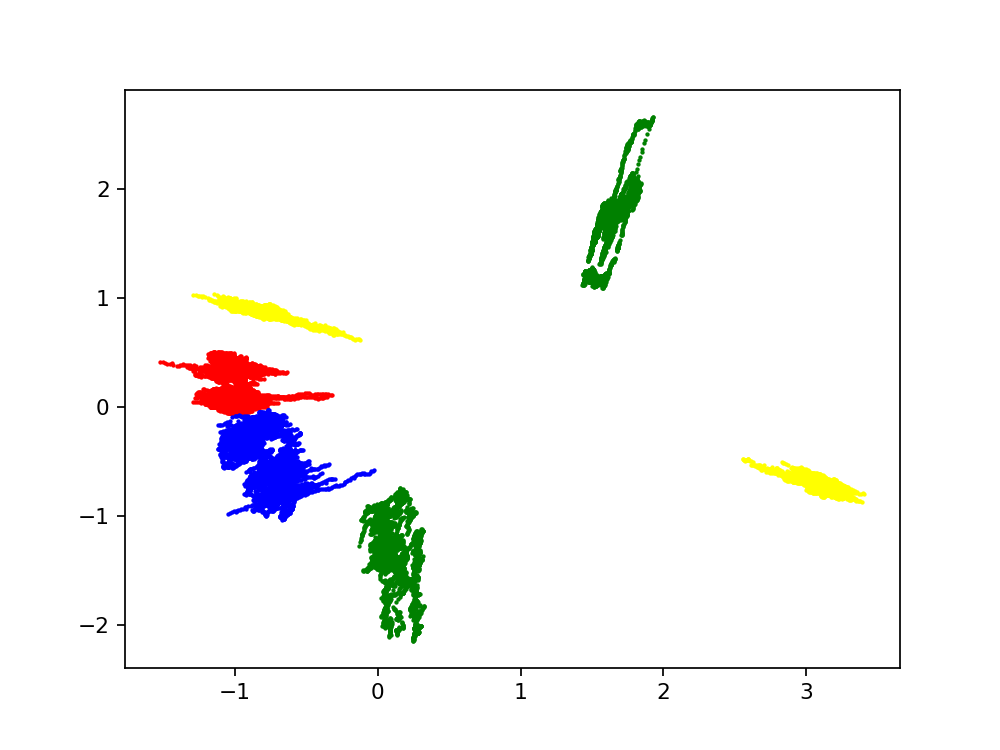

In [35]:
# 2D plot of terrains
plt.figure()
plt.scatter(x=tile['PC1_2d'], y=tile['PC2_2d'], c='red', s=1)
plt.scatter(x=turf['PC1_2d'], y=turf['PC2_2d'], c='blue', s=1)
plt.scatter(x=carp['PC1_2d'], y=carp['PC2_2d'], c='green', s=1)
plt.scatter(x=arcTile['PC1_2d'], y=arcTile['PC2_2d'], c='yellow', s=1)

In [36]:
init_notebook_mode(connected=True)

In [37]:
# plotly for interactive 3D plot of clusters
t0 = go.Scatter3d(x=c0['PC1_3d'], y=c0['PC2_3d'], z=c0['PC3_3d'],
               mode="markers", name="Cluster 0",
               marker = dict(color = 'purple'),
               text=None)
t1 = go.Scatter3d(x=c1['PC1_3d'], y=c1['PC2_3d'], z=c1['PC3_3d'],
               mode="markers", name="Cluster 1",
               marker = dict(color = 'brown'),
               text=None)
t2 = go.Scatter3d(x=c2['PC1_3d'], y=c2['PC2_3d'], z=c2['PC3_3d'],
               mode="markers", name="Cluster 2",
               marker = dict(color = 'grey'),
               text=None)
t3 = go.Scatter3d(x=c3['PC1_3d'], y=c3['PC2_3d'], z=c3['PC3_3d'],
               mode="markers", name="Cluster 3",
               marker = dict(color = 'blue'),
               text=None)
# t4 = go.Scatter3d(x=c4['PC1_3d'], y=c4['PC2_3d'], z=c4['PC3_3d'],
#                mode="markers", name="Cluster 4",
#                marker = dict(color = 'green'),
#                text=None)
# t5 = go.Scatter3d(x=c5['PC1_3d'], y=c5['PC2_3d'], z=c5['PC3_3d'],
#                mode="markers", name="Cluster 5",
#                marker = dict(color = 'orange'),
#                text=None)
# t6 = go.Scatter3d(x=c6['PC1_3d'], y=c6['PC2_3d'], z=c6['PC3_3d'],
#                mode="markers", name="Cluster 6",
#                marker = dict(color = 'red'),
#                text=None)
# t7 = go.Scatter3d(x=c7['PC1_3d'], y=c7['PC2_3d'], z=c7['PC3_3d'],
#                mode="markers", name="Cluster 7",
#                marker = dict(color = 'yellow'),
#                text=None)
plotData = [t0, t1, t2, t3] #, t4, t5, t6, t7]
title = "IMU Clustering"
layout = dict(title=title, xaxis=dict(title='PC1',ticklen= 5,zeroline= False), yaxis=dict(title= '',ticklen= 5,zeroline= False))

fig=dict(data=plotData, layout=layout)

In [38]:
iplot(fig)

In [39]:
# plotly for interactive 3D plot of terrains
tilePlot = go.Scatter3d(x=tile['PC1_3d'], y=tile['PC2_3d'], z=tile['PC3_3d'],
               mode="markers", name="Tile",
               marker = dict(color = 'purple'),
               text=None)
turfPlot = go.Scatter3d(x=turf['PC1_3d'], y=turf['PC2_3d'], z=turf['PC3_3d'],
               mode="markers", name="Turf",
               marker = dict(color = 'brown'),
               text=None)
carpPlot = go.Scatter3d(x=carp['PC1_3d'], y=carp['PC2_3d'], z=carp['PC3_3d'],
               mode="markers", name="Carpet",
               marker = dict(color = 'green'),
               text=None)
arcTilePlot = go.Scatter3d(x=arcTile['PC1_3d'], y=arcTile['PC2_3d'], z=arcTile['PC3_3d'],
               mode="markers", name="ArcTile",
               marker = dict(color = 'red'),
               text=None)

plotData = [tilePlot, turfPlot, carpPlot, arcTilePlot]
title = "IMU Clustering Tile vs Turf vs Carpet vs Arc Tile"
layout = dict(title=title, xaxis=dict(title='PC1',ticklen= 5,zeroline= False), yaxis=dict(title= '',ticklen= 5,zeroline= False))

fig2=dict(data=plotData, layout=layout)

In [40]:
iplot(fig2)

Therefore we can see that K means clustering does a reasonable job of partitioning data into clusters that are mostly one terrain or the other. We can see that the two terrains are roughly seperable in 3 principle components, and likely more separable in high dimension space. 